In [2]:
import numpy as np
import astropy.units as u
from astropy.io import fits
from matplotlib.colors import LogNorm
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output
from importlib import reload
from scipy.optimize import minimize

import poppy
import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('DEBUG')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)
poppy_log.disabled = True

import warnings
warnings.filterwarnings("ignore")

from aefc_vortex.math_module import xp, xcipy, ensure_np_array
from aefc_vortex import utils
from aefc_vortex.imshows import imshow1, imshow2, imshow3, plot_data
from aefc_vortex import dm
from aefc_vortex import props
from aefc_vortex import aefc_2dm as aefc
import aefc_vortex.fresnel_2dm_96 as fresnel
import aefc_vortex.fraunhofer_2dm_96 as fraunhofer

Nwaves = 15
wavelength_c = 650e-9
bw = 0.10
waves = np.linspace(wavelength_c * (1-bw/2), wavelength_c * (1+bw/2), Nwaves )
bandpasses = waves.reshape(3,5)
print(bandpasses)

Nwaves_per_bp = bandpasses.shape[1]
control_waves = bandpasses[:, Nwaves_per_bp//2]
print(control_waves)

dm1_flat = xp.rot90(xp.rot90( utils.load_fits('data/dm1_flat_command_96.fits') ))
M = fraunhofer.MODEL()
dm1_flat += 1e-9*xp.random.randn(M.Nact,M.Nact) * M.dm_mask

/home/kianmilani/Projects/adefc-vortex/aefc_vortex
[[6.17500000e-07 6.22142857e-07 6.26785714e-07 6.31428571e-07
  6.36071429e-07]
 [6.40714286e-07 6.45357143e-07 6.50000000e-07 6.54642857e-07
  6.59285714e-07]
 [6.63928571e-07 6.68571429e-07 6.73214286e-07 6.77857143e-07
  6.82500000e-07]]
[6.26785714e-07 6.50000000e-07 6.73214286e-07]


/home/kianmilani/Projects/adefc-vortex/aefc_vortex


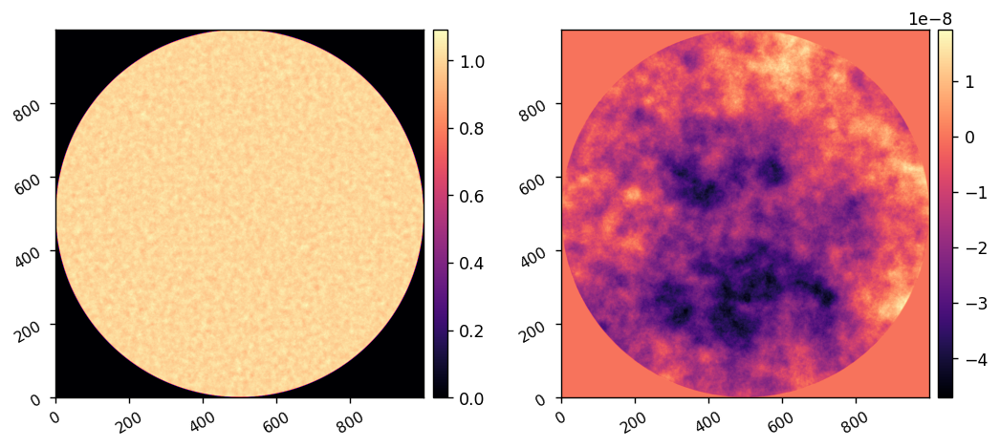

In [2]:
reload(fresnel)
I = fresnel.CORO(
    # dm1_ref=dm1_flat,
)
# I = fresnel.CORO(
#     dm1_gains=1 + 0.02*xp.random.randn(96,96),
#     dm2_gains=1 + 0.02*xp.random.randn(96,96),
#     inf_fun_coupling=0.17,
#     dm1_shift=np.array([100, 25 ])*u.um,
#     dm2_shift=np.array([-25, -100 ])*u.um,
#     lyot_shift=np.array([-50, -50 ])*u.um,
#     # dm1_ref=dm1_flat,
# )
I = fresnel.CORO(
    dm1_gains=1 + 0.02*xp.random.randn(96,96),
    dm2_gains=1 + 0.02*xp.random.randn(96,96),
    inf_fun_coupling=0.17,
    dm1_shift=np.array([75, 75 ])*u.um,
    dm2_shift=np.array([-75, -75 ])*u.um,
    lyot_shift=np.array([-75, 75 ])*u.um,
    # dm1_ref=dm1_flat,
)
I.use_opds = True

AMP, OPD = I.calc_pupil()
imshow2(AMP, OPD)

/home/kianmilani/Projects/adefc-vortex/aefc_vortex


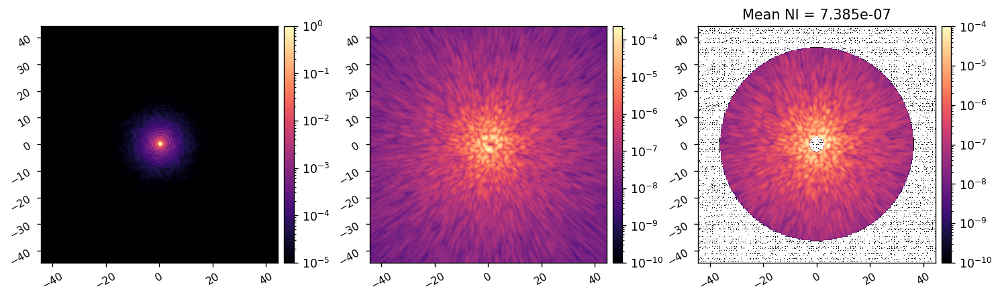

In [3]:
reload(fresnel)
I = fresnel.CORO(
    # dm1_ref=dm1_flat,
)
# I = fresnel.CORO(
#     dm1_gains=1 + 0.02*xp.random.randn(96,96),
#     dm2_gains=1 + 0.02*xp.random.randn(96,96),
#     inf_fun_coupling=0.17,
#     dm1_shift=np.array([100, 25 ])*u.um,
#     dm2_shift=np.array([-25, -100 ])*u.um,
#     lyot_shift=np.array([-50, -50 ])*u.um,
#     # dm1_ref=dm1_flat,
# )
I = fresnel.CORO(
    dm1_gains=1 + 0.02*xp.random.randn(96,96),
    dm2_gains=1 + 0.02*xp.random.randn(96,96),
    inf_fun_coupling=0.17,
    dm1_shift=np.array([75, 75 ])*u.um,
    dm2_shift=np.array([-75, -75 ])*u.um,
    lyot_shift=np.array([-75, 75 ])*u.um,
    # dm1_ref=dm1_flat,
)
I.use_opds = True
I.bandpasses = bandpasses

I.use_vortex = False
ref_psf = I.snap()
I.Imax_ref = xp.max(ref_psf)
ref_psf /= I.Imax_ref
I.use_vortex = True
ref_coro_im = I.snap()

reload(utils)
I.reset_dms()
iwa = 3
owa = 36
rot = 0
control_mask = utils.create_annular_focal_plane_mask(I.npsf, I.psf_pixelscale_lamDc, irad=iwa, orad=owa, edge=None, rotation=rot)
# control_mask = utils.create_annular_focal_plane_mask(I.npsf, I.psf_pixelscale_lamDc, irad=iwa, orad=owa, edge=iwa, rotation=rot)
mean_ni0 = xp.mean(ref_coro_im[control_mask])

imshow3(
    ref_psf, ref_coro_im, ref_coro_im*control_mask,
    '', '', f'Mean NI = {mean_ni0:.3e}',
    pxscl=I.psf_pixelscale_lamDc, 
    lognorm=True, vmin1=1e-5, vmin2=1e-10, vmin3=1e-10,
)


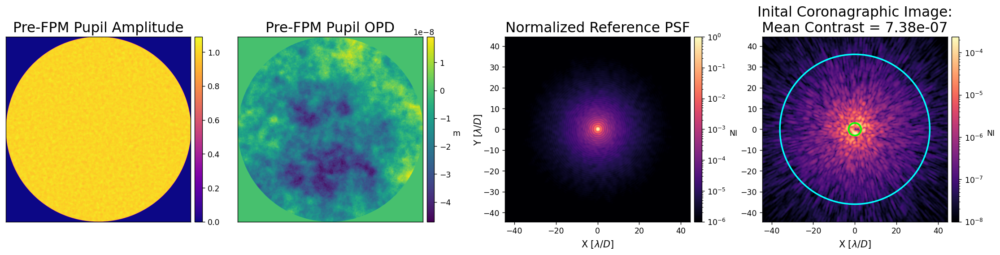

In [17]:
import matplotlib.pyplot as plt
plt.rcParams['image.origin']='lower'
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm, Normalize
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Circle

fig,ax = plt.subplots(nrows=1, ncols=4, figsize=(18,12), dpi=125)
ext = I.psf_pixelscale_lamDc*I.npsf/2
extent = [-ext, ext, -ext, ext]

patch1 = Circle((0,0), 3, fill=False, color='lime', linewidth=2.0)
patch2 = Circle((0,0), 36, fill=False, color='cyan', linewidth=2.0)

w = 0.275
tfs = 18

im1 = ax[0].imshow( ensure_np_array(AMP), cmap='plasma')
ax[0].set_title(f'Pre-FPM Pupil Amplitude', fontsize=tfs)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="4%", pad=0.075)
cbar = fig.colorbar(im1, cax=cax)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_position([0, 0, w, w]) # [left, bottom, width, height]

im2 = ax[1].imshow( ensure_np_array(OPD), cmap='viridis')
ax[1].set_title(f'Pre-FPM Pupil OPD', fontsize=tfs)
divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="4%", pad=0.075)
cbar = fig.colorbar(im2, cax=cax,)
cbar.ax.set_ylabel('m', rotation=0, labelpad=7)
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_position([0.23, 0, w, w])

im3 = ax[2].imshow( ensure_np_array(ref_psf), norm=LogNorm(vmax=1, vmin=1e-6), cmap='magma', extent=extent)
ax[2].set_title(f'Normalized Reference PSF', fontsize=tfs)
divider = make_axes_locatable(ax[2])
cax = divider.append_axes("right", size="4%", pad=0.075)
cbar = fig.colorbar(im3, cax=cax)
cbar.ax.set_ylabel('NI', rotation=0, labelpad=10)
ax[2].set_position([0.495, 0, w, w])

im4 = ax[3].imshow( ensure_np_array(ref_coro_im), norm=LogNorm(vmin=1e-8), cmap='magma', extent=extent)
ax[3].set_title(f'Inital Coronagraphic Image:\nMean Contrast = {mean_ni0:.2e}', fontsize=tfs)
divider = make_axes_locatable(ax[3])
cax = divider.append_axes("right", size="4%", pad=0.075)
cbar = fig.colorbar(im4, cax=cax,)
cbar.ax.set_ylabel('NI', rotation=0, labelpad=10)
ax[3].add_patch(patch1)
ax[3].add_patch(patch2)
ax[3].set_position([0.75, 0, w, w])

ax[2].set_ylabel('Y [$\lambda/D$]', fontsize=12, labelpad=0)
ax[2].set_xlabel('X [$\lambda/D$]', fontsize=12, labelpad=5)
ax[3].set_xlabel('X [$\lambda/D$]', fontsize=12, labelpad=5)

# plt.subplots_adjust(wspace=0.25)
fig.savefig('../figs/sim_fresnel_model.pdf', format='pdf', bbox_inches="tight")

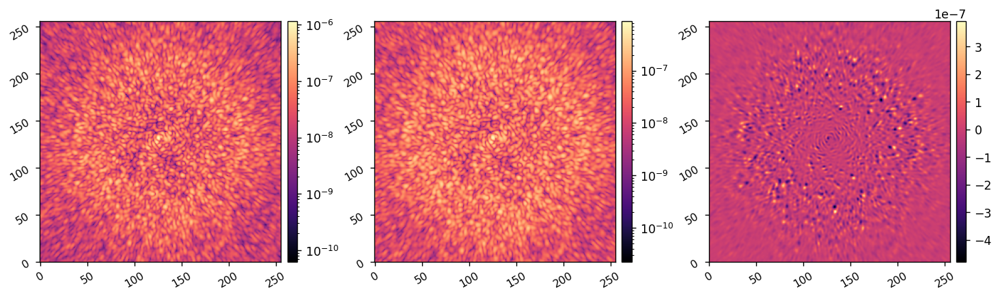

In [24]:
im_bp1 = I.snap(1)
im_bp3 = I.snap(3)
diff = im_bp3 - im_bp1
imshow3(im_bp1, im_bp3, diff, lognorm1=True, lognorm2=True, )

In [6]:
control_waves

array([6.26785714e-07, 6.50000000e-07, 6.73214286e-07])

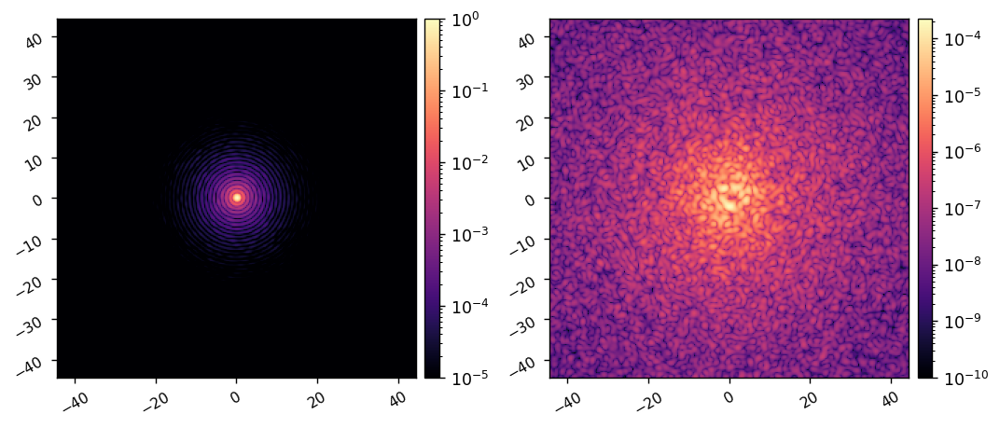

In [4]:
reload(fraunhofer)
M = fraunhofer.MODEL()
M.AMP = AMP
M.OPD = OPD

M.flip_dm = True
M.flip_lyot = True

acts = xp.zeros(M.Nacts)

model_psf = xp.abs( M.forward(acts, M.wavelength_c, use_vortex=0) )**2
M.setattr('Imax_ref', xp.max(model_psf))
model_psf /= M.Imax_ref

model_coro_im = xp.abs( M.forward(acts, M.wavelength_c, use_vortex=1) )**2

imshow2(model_psf, model_coro_im,
        pxscl=M.psf_pixelscale_lamDc, lognorm=True, vmin1=1e-5, vmin2=1e-10)

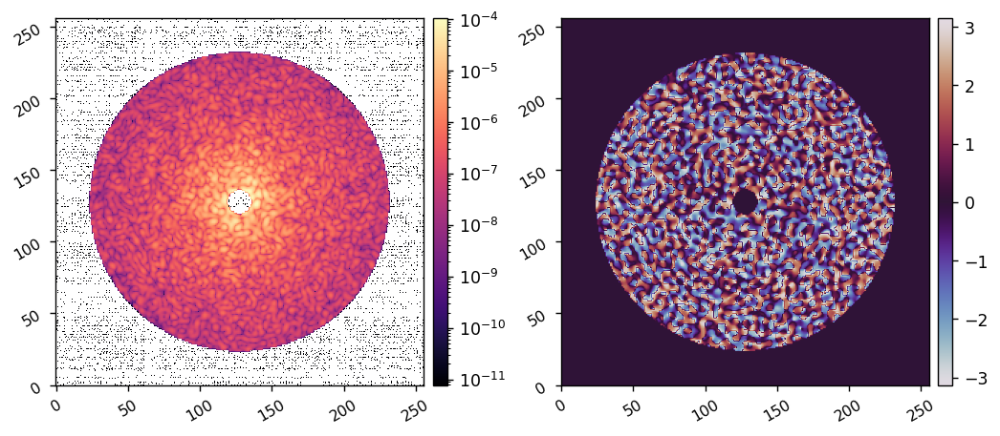

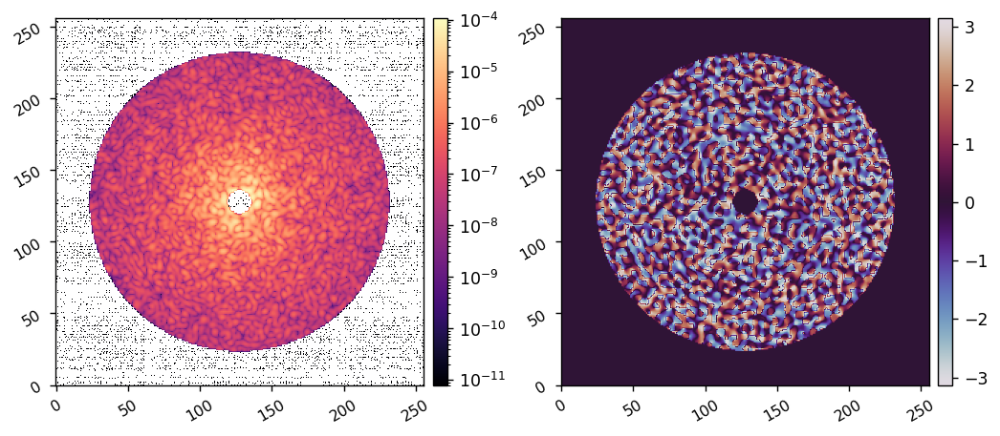

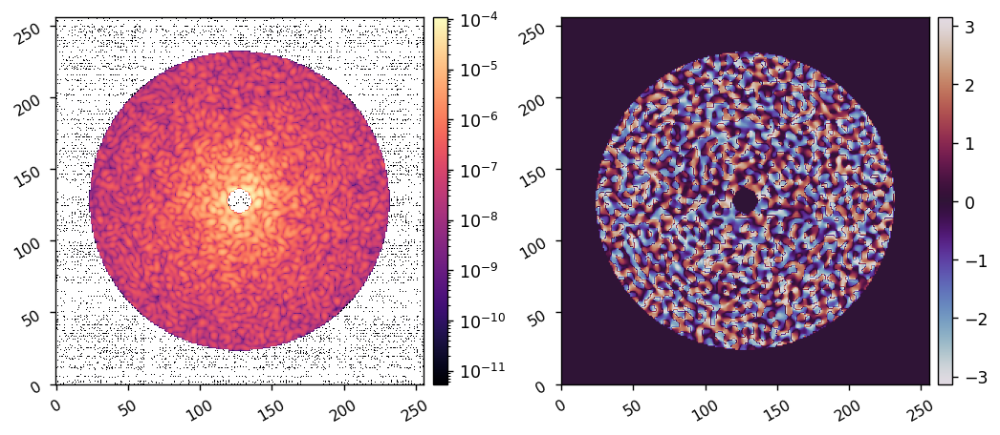

In [5]:
reload(aefc)
E_abs = aefc.calc_wfs(I, control_waves, control_mask, plot=1)


	Cost-function J_delE: 0.026
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.026
	Total cost-function value: 1.000

	Cost-function J_delE: 0.025
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.025
	Total cost-function value: 1.000

	Cost-function J_delE: 0.023
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.023
	Total cost-function value: 1.000



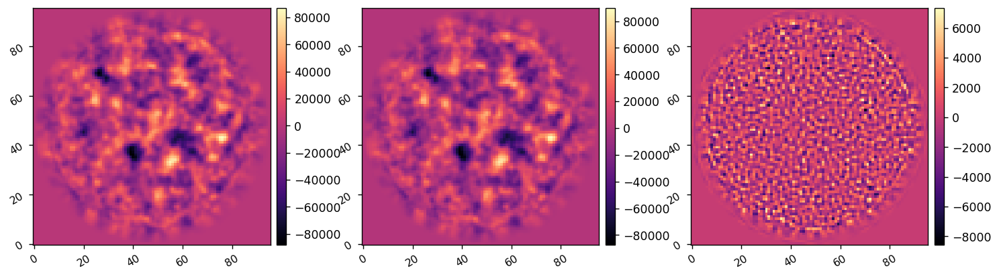

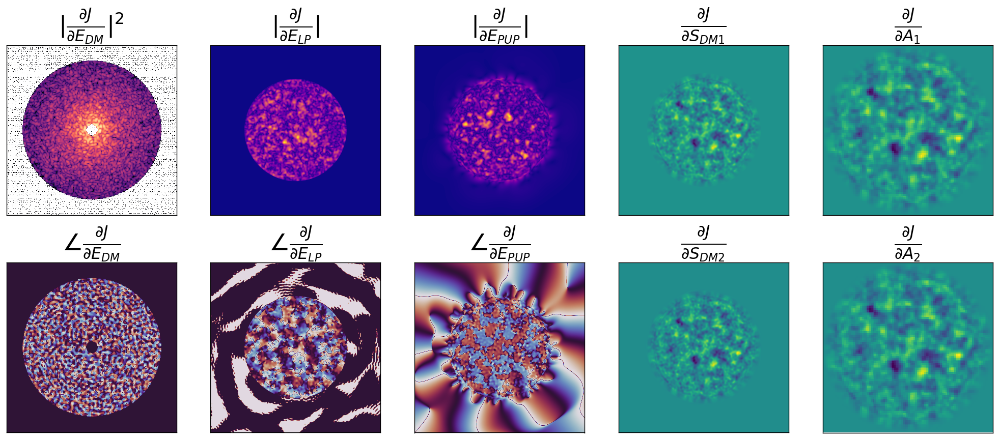

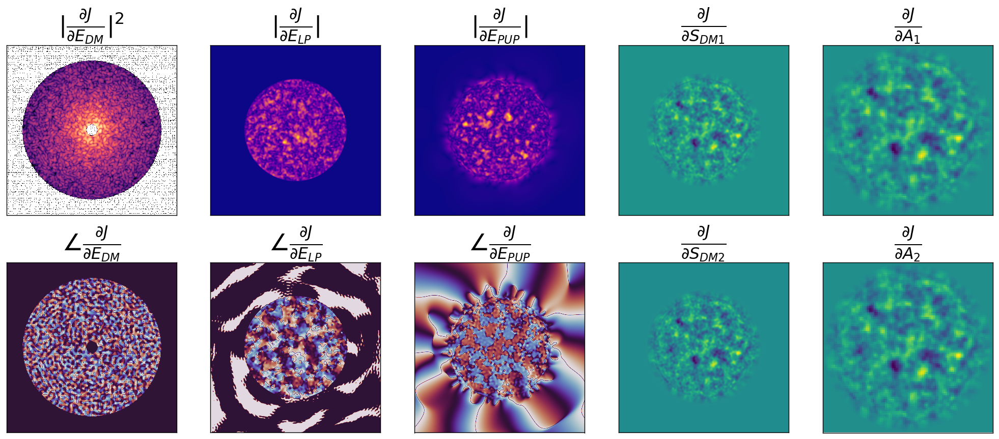

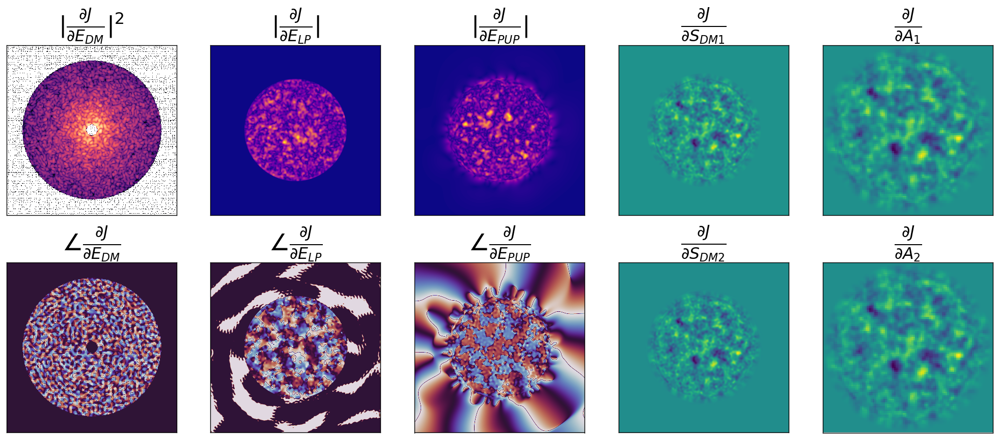

In [6]:
reload(fraunhofer)
reload(aefc)
current_acts = xp.zeros(M.Nacts)
# current_acts = fits.getdata('ad_test_acts.fits')

I.reset_dms()
I.add_dm1(fraunhofer.acts_to_command(current_acts[:M.Nacts//2], M.dm_mask))
I.add_dm2(fraunhofer.acts_to_command(current_acts[M.Nacts//2:], M.dm_mask))

E_abs = aefc.calc_wfs(I, control_waves, control_mask, plot=0)
# E_FP_NOMs, E_EPs, E_DM2Ps, DM1_PHASORs, DM2_PHASORs = aefc.get_forward_vars(M, current_acts, control_waves)
E_FP_NOMs = aefc.get_E_NOMs(M, current_acts, control_waves)

rmad_vars = { 
    'current_acts':current_acts,
    'E_abs':E_abs, 
    'E_FP_NOMs':E_FP_NOMs,
    'control_mask':control_mask,
    'control_waves':control_waves,
    'r_cond':1e-3,
    'weights':None,
    # 'weights':np.array([10,1,10]), 
}

del_acts = np.zeros(M.Nacts)
J, dJ_dA = fraunhofer.val_and_grad_bb(
    del_acts, 
    M, rmad_vars, 
    verbose=True, 
    # plot=True, 
    fancy_plot=True,
)

dm1_grad = fraunhofer.acts_to_command(dJ_dA[:M.Nacts//2], M.dm_mask)
dm2_grad = fraunhofer.acts_to_command(dJ_dA[M.Nacts//2:], M.dm_mask)
imshow3(dm1_grad, dm2_grad, dm2_grad-dm1_grad)

In [ ]:
reload(fraunhofer)
reload(aefc)

current_acts = xp.zeros(M.Nacts)
# current_acts = fits.getdata('ad_test_acts.fits')

I.reset_dms()
I.add_dm1(fraunhofer.acts_to_command(current_acts[:M.Nacts//2], M.dm_mask))
I.add_dm2(fraunhofer.acts_to_command(current_acts[M.Nacts//2:], M.dm_mask))

E_abs = aefc.calc_wfs(I, control_waves, control_mask, plot=0)
E_FP_NOMs = aefc.get_E_NOMs(M, current_acts, control_waves)

rmad_vars = { 
    'current_acts':current_acts,
    'E_abs':E_abs, 
    'E_FP_NOMs':E_FP_NOMs,
    'control_mask':control_mask,
    'control_waves':control_waves,
    'r_cond':1e-3,
    'weights':None,
    # 'weights':np.array([10,1,10]), 
}

bfgs_tol = 1e-3
bfgs_opts = {
    'disp':True,
    # 'maxls':50,
    # 'ftol':1e-6,
    # 'gtol':1e-6,
}

del_acts0 = np.zeros(M.Nacts)
res = minimize(
    fraunhofer.val_and_grad_bb, 
    jac=True, 
    x0=del_acts0,
    args=(M, rmad_vars, True, False), 
    method='L-BFGS-B',
    tol=bfgs_tol,
    options=bfgs_opts,
)


	Cost-function J_delE: 0.026
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.026
	Total cost-function value: 1.000

	Cost-function J_delE: 0.025
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.025
	Total cost-function value: 1.000

	Cost-function J_delE: 0.023
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.023
	Total cost-function value: 1.000

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14736     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.00000D+00    |proj g|=  8.97465D+04
	Cost-function J_delE: 0.056
	Cost-function J_c: 2366863905.325
	Cost-function normalization factor: 0.026
	Total cost-function value: 90481571947.680



 This problem is unconstrained.


	Cost-function J_delE: 0.051
	Cost-function J_c: 2366863905.325
	Cost-function normalization factor: 0.025
	Total cost-function value: 95608879527.939

	Cost-function J_delE: 0.048
	Cost-function J_c: 2366863905.325
	Cost-function normalization factor: 0.023
	Total cost-function value: 100911322826.516

	Cost-function J_delE: 8.893
	Cost-function J_c: 0.038
	Cost-function normalization factor: 0.026
	Total cost-function value: 341.415

	Cost-function J_delE: 8.792
	Cost-function J_c: 0.038
	Cost-function normalization factor: 0.025
	Total cost-function value: 356.694

	Cost-function J_delE: 8.696
	Cost-function J_c: 0.038
	Cost-function normalization factor: 0.023
	Total cost-function value: 372.344

	Cost-function J_delE: 0.018
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.026
	Total cost-function value: 0.690

	Cost-function J_delE: 0.017
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.025
	Total cost-function value: 0.692

	Cost-function J_delE: 0

7.384992698607186e-07 1.1021412303989491e-07


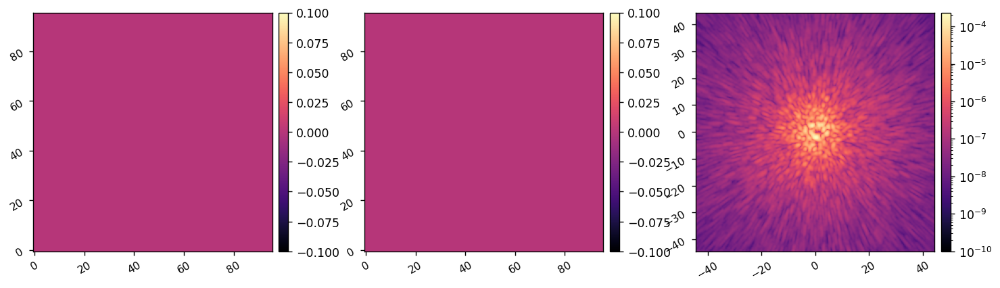

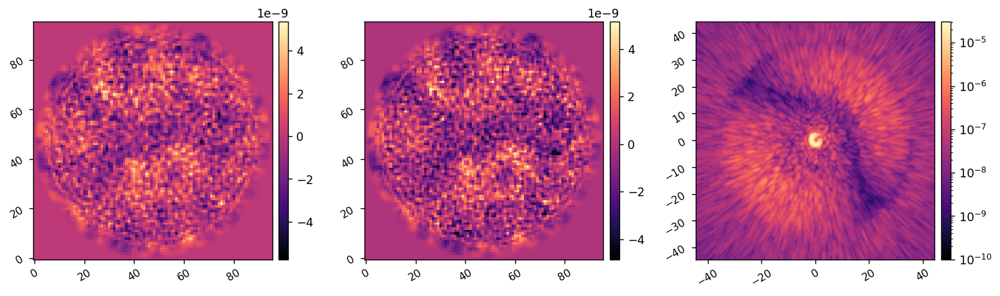

In [8]:
I.reset_dms()
old_dm1 = I.get_dm1()
old_dm2 = I.get_dm2()
old_im = I.snap()

del_dm1 = fraunhofer.acts_to_command(res.x[:M.Nacts//2], I.dm_mask)
del_dm2 = fraunhofer.acts_to_command(res.x[M.Nacts//2:], I.dm_mask)
I.add_dm1(del_dm1)
I.add_dm2(del_dm2)
new_im = I.snap()

print(xp.mean(old_im[control_mask]), xp.mean(new_im[control_mask]))
imshow3(old_dm1, old_dm2, old_im, lognorm3=True, pxscl3=I.psf_pixelscale_lamDc, vmin3=1e-10,)
imshow3(del_dm1, del_dm2, new_im, lognorm3=True, pxscl3=I.psf_pixelscale_lamDc, vmin3=1e-10,)

In [18]:
utils.save_fits('ad_test_acts.fits', res.x)

Saved data to:  ad_test_acts.fits


In [5]:
I.reset_dms()
data = {
    # 'ref_im':ref_coro_im, 
    'images':[ref_coro_im],
    'efields':[],
    'dm1_commands':[],
    'del_dm1_commands':[],
    'dm2_commands':[],
    'del_dm2_commands':[],
    'reg_conds':[],
    'bfgs_tols':[],
    'pixelscale':I.psf_pixelscale_lamDc,
    'control_mask':control_mask, 
}

Computing E-field with model ...
Computing EFC command with L-BFGS
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14736     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.00000D+00    |proj g|=  8.63762D+06


 This problem is unconstrained.



At iterate    1    f=  9.02449D-01    |proj g|=  5.35949D+06

At iterate    2    f=  7.97581D-01    |proj g|=  1.87315D+06

At iterate    3    f=  7.86639D-01    |proj g|=  1.98943D+06

At iterate    4    f=  7.85657D-01    |proj g|=  1.36735D+06

At iterate    5    f=  7.85617D-01    |proj g|=  1.30934D+06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
14736      5     20      1     0     0   1.309D+06   7.856D-01
  F =  0.78561675803326025     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


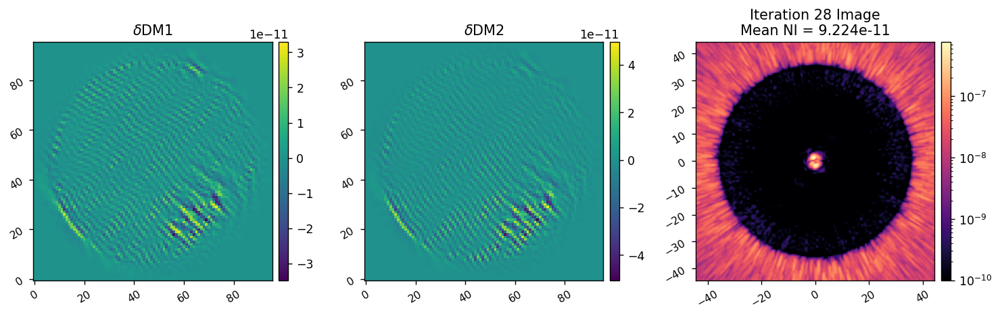

Computing E-field with model ...
Computing EFC command with L-BFGS
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14736     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.00000D+00    |proj g|=  3.23422D+06


 This problem is unconstrained.



At iterate    1    f=  9.84231D-01    |proj g|=  2.46191D+06

At iterate    2    f=  9.44149D-01    |proj g|=  2.09169D+06

At iterate    3    f=  9.44055D-01    |proj g|=  1.74054D+06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
14736      3     11      1     0     0   1.741D+06   9.441D-01
  F =  0.94405460449856360     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


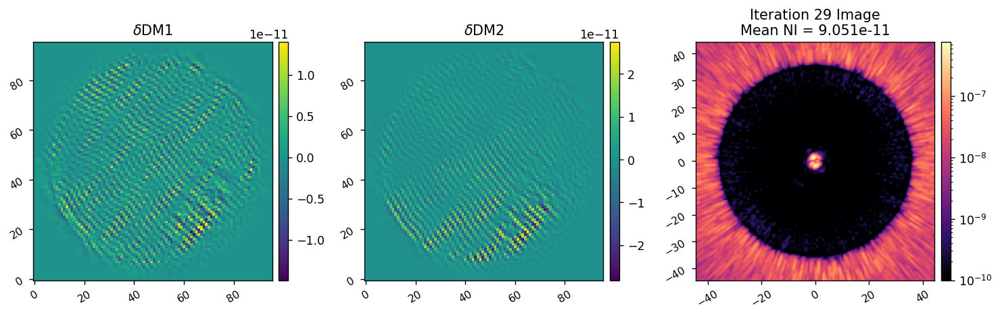

Computing E-field with model ...
Computing EFC command with L-BFGS
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14736     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.00000D+00    |proj g|=  2.01538D+06


 This problem is unconstrained.



At iterate    1    f=  9.92435D-01    |proj g|=  1.79951D+06

At iterate    2    f=  9.68066D-01    |proj g|=  1.81766D+06

At iterate    3    f=  9.67276D-01    |proj g|=  1.51271D+06

At iterate    4    f=  9.67276D-01    |proj g|=  1.51200D+06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
14736      4     19      1     0     0   1.512D+06   9.673D-01
  F =  0.96727572033370091     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


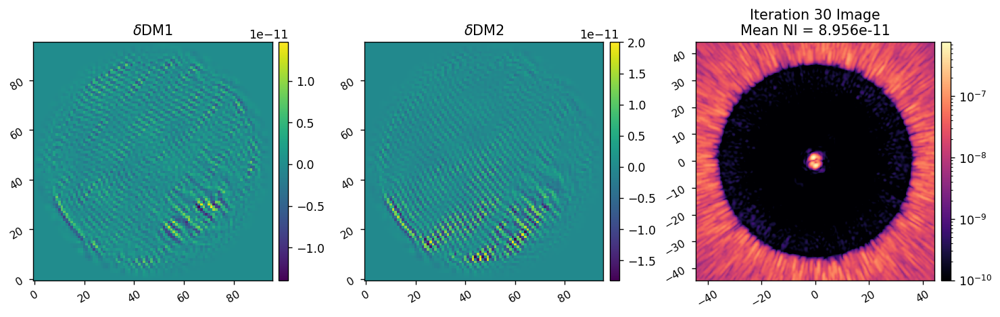

In [16]:
reload(fraunhofer)
reload(aefc)

bfgs_tol = 1e-2
bfgs_tol = 1e-3
bfgs_tol = 1e-4
# bfgs_tol = 1e-5
# bfgs_tol = 1e-10

bfgs_opts = {
    'disp':True,
    'maxls':10, 
    'maxiter':50,
    # 'ftol':1e-6,
    # 'gtol':1e-6,
}

data = aefc.run_bb(
    I, 
    M, 
    fraunhofer.val_and_grad_bb, 
    control_mask, 
    data,
    Nitr=3, reg_cond=1e-1,
    # Nitr=3, reg_cond=1e-2,
    # Nitr=3, reg_cond=1e-3,
    # Nitr=3, reg_cond=1e-4,
    # Nitr=3, reg_cond=1e-5,
    # Nitr=3, reg_cond=1e-6,
    # Nitr=3, reg_cond=1e-7,
    # Nitr=3, reg_cond=1e-8,
    # Nitr=3, reg_cond=1e-12,
    # weights=np.array([20,1,20]), 
    bfgs_tol=bfgs_tol,
    bfgs_opts=bfgs_opts,
    gain=1,
)



In [17]:
from datetime import datetime
today = int(datetime.today().strftime('%Y%m%d'))
utils.save_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{today}_aefc_run_with_ME.pkl', data)
# utils.save_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{today}_aefc_run_with_ME_2.pkl', data)

Saved data to:  /npool/nvme/kianmilani/aefc-vortex-data/20250310_aefc_run_with_ME.pkl


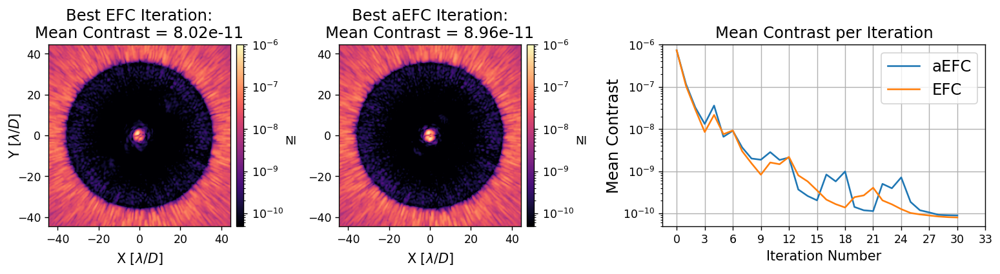

In [18]:

# efc_data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20241203}_efc_run_with_ME.pkl')
efc_data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20241220}_efc_run_with_ME_2.pkl')

# aefc_data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20241204}_aefc_run_with_ME_2.pkl')
# aefc_data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20241220}_aefc_run_with_ME_2.pkl')

# aefc_data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20250205}_aefc_run_with_ME.pkl')

# aefc_data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20250307}_aefc_run_with_ME.pkl')
# aefc_data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20250307}_aefc_run_with_ME_2.pkl')

aefc_data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20250310}_aefc_run_with_ME.pkl')

import aefc_vortex.imshows as imshows
reload(imshows)
imshows.plot_both_data(
    efc_data,  aefc_data,
    im1vmin=5e-11, im1vmax=1e-6, 
    im2vmin=5e-11, im2vmax=1e-6, 
    vmin=5e-11, vmax=1e-6,
    xticks=np.arange(0,33+0.1,3),
)

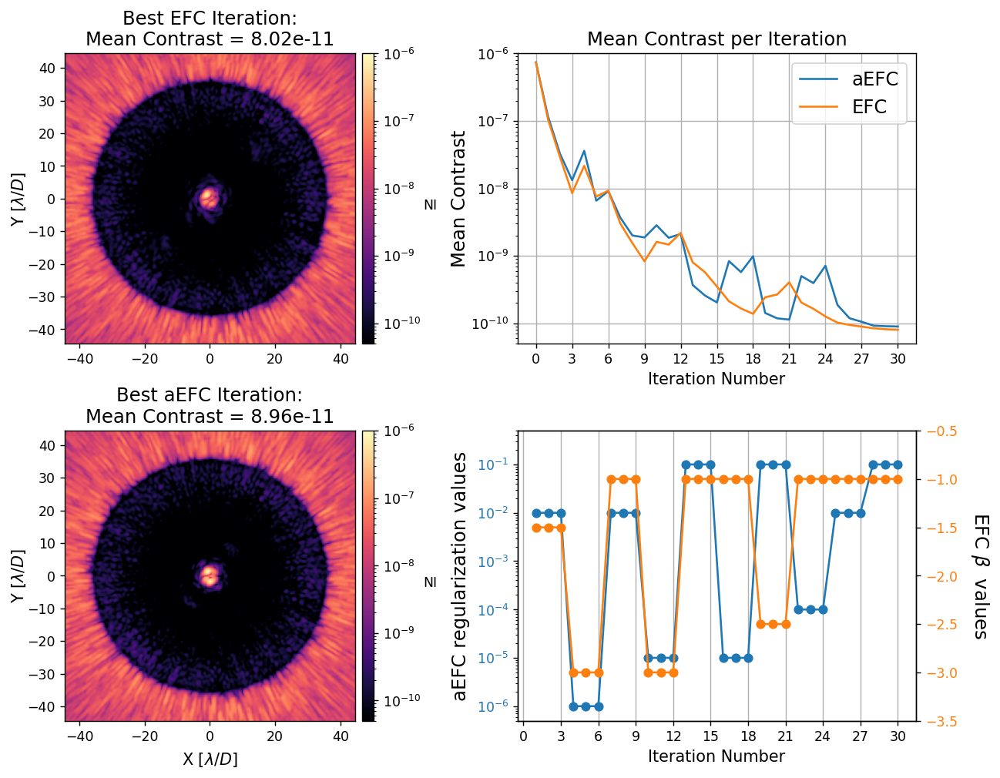

In [3]:

# efc_data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20241203}_efc_run_with_ME.pkl')
efc_data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20241220}_efc_run_with_ME_2.pkl')

# aefc_data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20241204}_aefc_run_with_ME_2.pkl')
# aefc_data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20241220}_aefc_run_with_ME_2.pkl')

aefc_data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20250310}_aefc_run_with_ME.pkl')

import aefc_vortex.imshows as imshows
reload(imshows)
imshows.plot_both_with_reg_conds(
    efc_data,  aefc_data,
    im1vmin=5e-11, im1vmax=1e-6, 
    im2vmin=5e-11, im2vmax=1e-6, 
    vmin=5e-11, vmax=1e-6,
    xticks=np.linspace(0,30,11),
    fname='../figs/sim_bb_with_me.pdf',
)

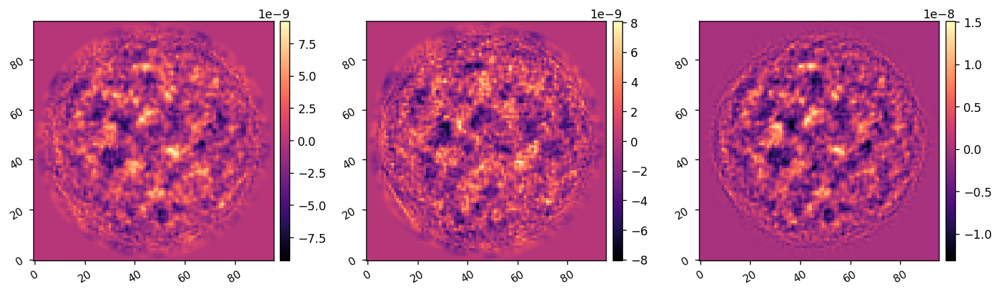

In [12]:
i = -1
imshow3(
    aefc_data['dm1_commands'][i], 
    aefc_data['dm2_commands'][i], 
    aefc_data['dm1_commands'][i]-aefc_data['dm2_commands'][i],
)

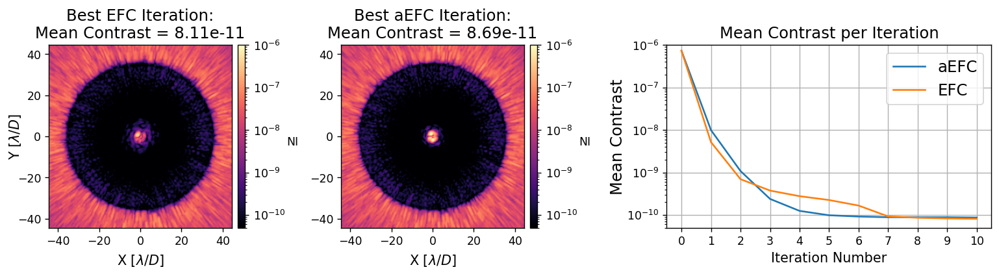

In [ ]:
efc_data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20241203}_efc_run_without_ME.pkl')
aefc_data = utils.load_pickle(f'/npool/nvme/kianmilani/aefc-vortex-data/{20241203}_aefc_run_without_ME.pkl')

import aefc_vortex.imshows as imshows
reload(imshows)
imshows.plot_both_data(
    efc_data,  aefc_data,
    im1vmin=5e-11, im1vmax=1e-6, 
    im2vmin=5e-11, im2vmax=1e-6, 
    vmin=5e-11, vmax=1e-6,
    xticks=np.linspace(0,10,11),
    fname='../figs/sim_bb.pdf',
)